# Supervised Learning: Support Vector Machines & Kernel Methods

In this lesson, we will explore **Support Vector Machines (SVMs)** in detail, focusing on **different kernels** and how they affect decision boundaries. We'll include conceptual and hands-on examples with **advanced toy datasets**. We'll also leverage **pipelines** and **ColumnTransformers** for best practices in scikit-learn.

## Outline
1. **SVM Conceptual Overview** (the margin, support vectors, strengths & weaknesses)
2. **Kernels** (linear, polynomial, RBF) – definitions, intuition
3. **Advantages & Disadvantages** of SVM
4. **Hands-on Examples** with advanced toy data
   - Using `make_classification` or other synthetic data
   - Setting up a Pipeline + ColumnTransformer
   - Trying different kernels (linear, poly, RBF)
   - Evaluating performance
5. **Summary** & next steps


## 1. SVM Conceptual Overview
A **Support Vector Machine** tries to find a **decision boundary** (hyperplane) that maximizes the margin between different classes. Key ideas:
1. **Margin**: The distance from the hyperplane to the nearest points (support vectors) from each class.
2. **Support Vectors**: The data points closest to the hyperplane. They “support” or define the boundary.
3. **Slack** / Soft-margin SVM: Allows misclassifications or points within margin if data isn't linearly separable, controlled by parameter `C`.

### Strengths
- Effective in **high-dimensional** spaces
- Can use **kernels** to handle non-linear decision boundaries
- Often robust to outliers with appropriate choice of `C`

### Weaknesses
- Choosing a suitable **kernel** and **hyperparameters** (like `C`, `gamma` in RBF) can be tricky.
- For large datasets, SVM can be **slower** (training complexity can be high if n is large).
- If many features >> samples, it might overfit unless well-regularized.


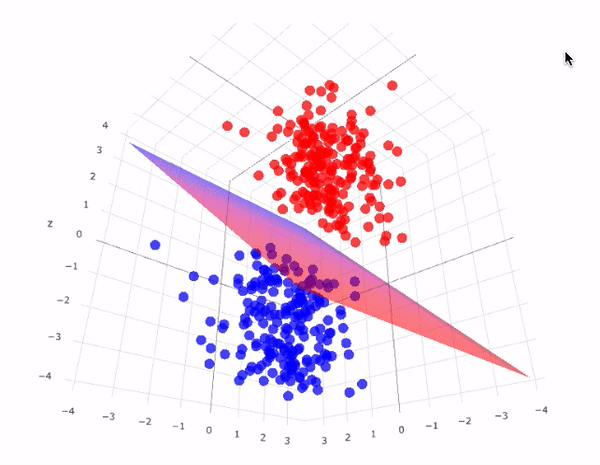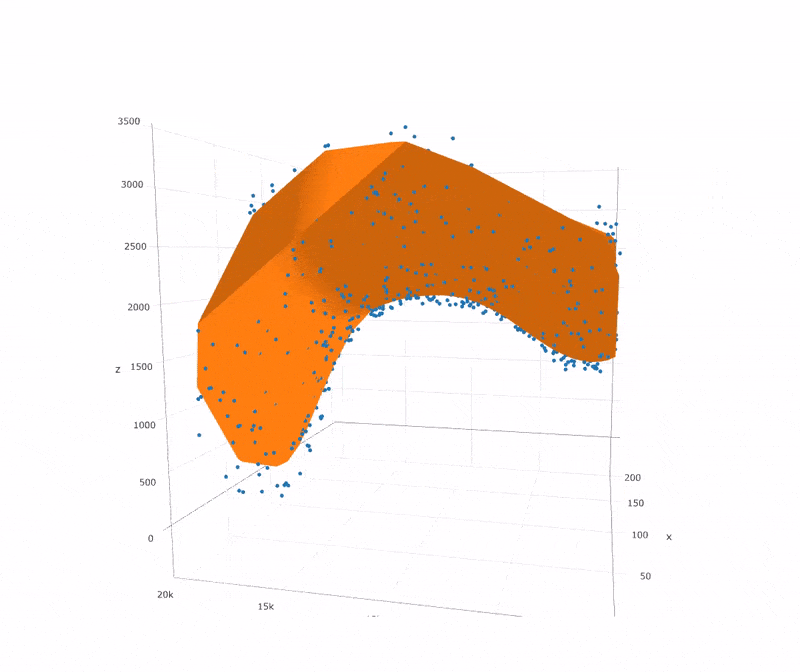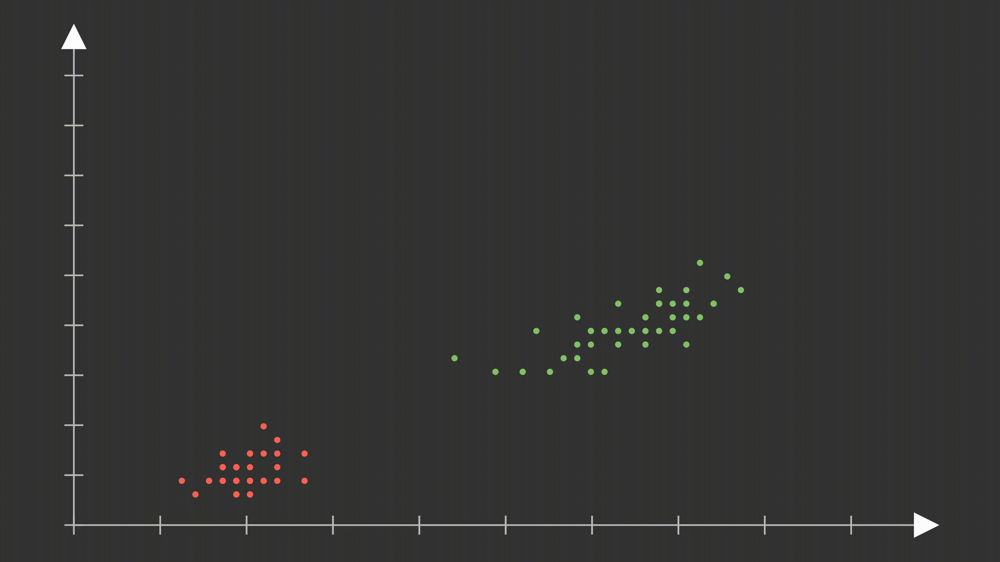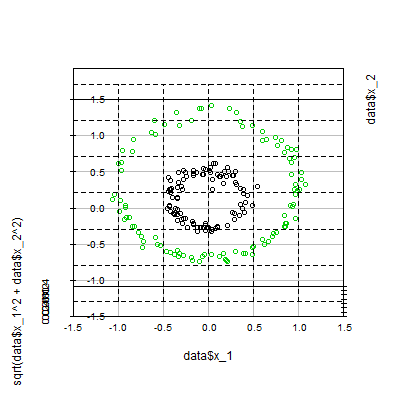

## 2. Kernels
A **kernel** transforms data (potentially nonlinearly) into a higher-dimensional space, letting SVM find a linear boundary in that space.

### 2.1 Linear Kernel
- The boundary is linear in the original feature space.
- Usually `kernel="linear"` in scikit-learn. Good for data that is roughly linearly separable or high-dimensional text data.

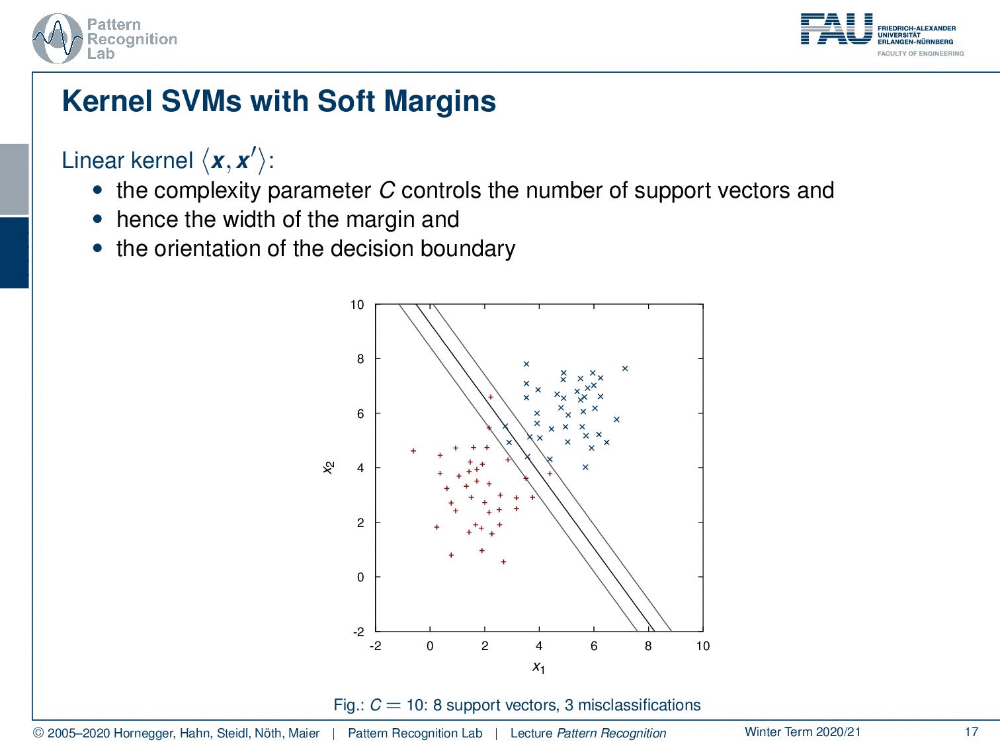


### 2.2 Polynomial Kernel
- $(\alpha * <x, x'> + c)^d$ – flexible polynomial boundaries.
- Parameters: degree `d`, `coef0` (the c), `alpha` can be part of `gamma`.
- Might be used for data with polynomial-like boundaries.

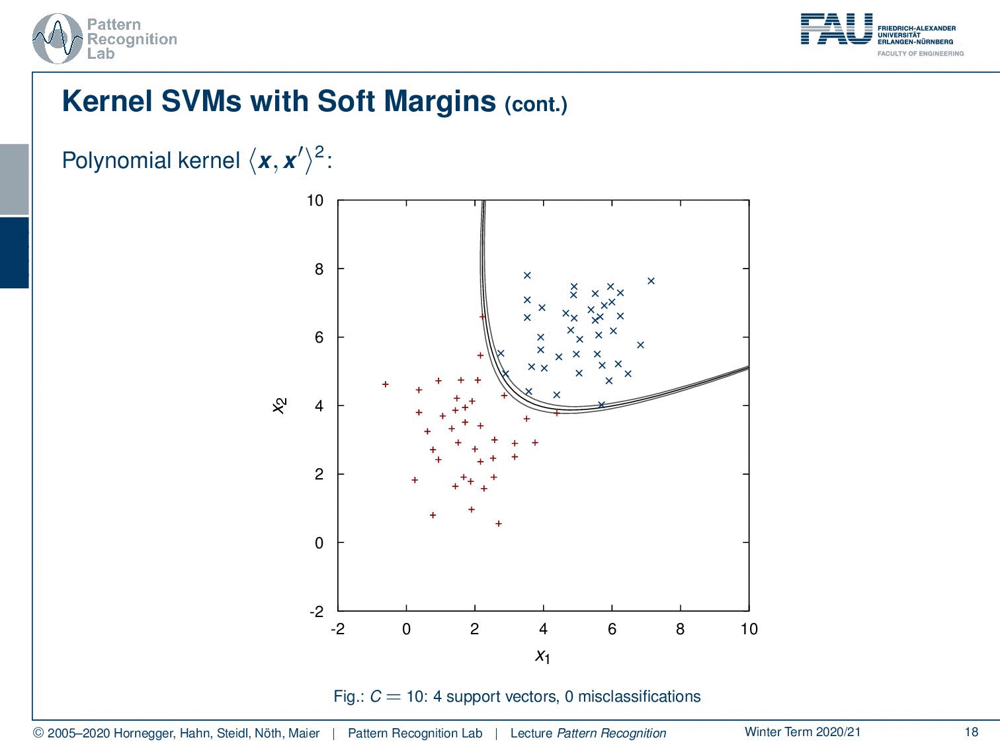

### 2.3 RBF (Radial Basis Function) Kernel
- The most popular: $exp(-\gamma * ||x - x'||^2)$.
- Good default for many problems if data is not linearly separable.
- Key parameter: `gamma` controlling the radius of influence.
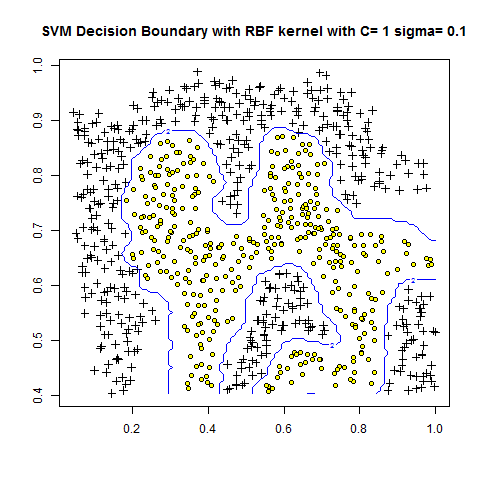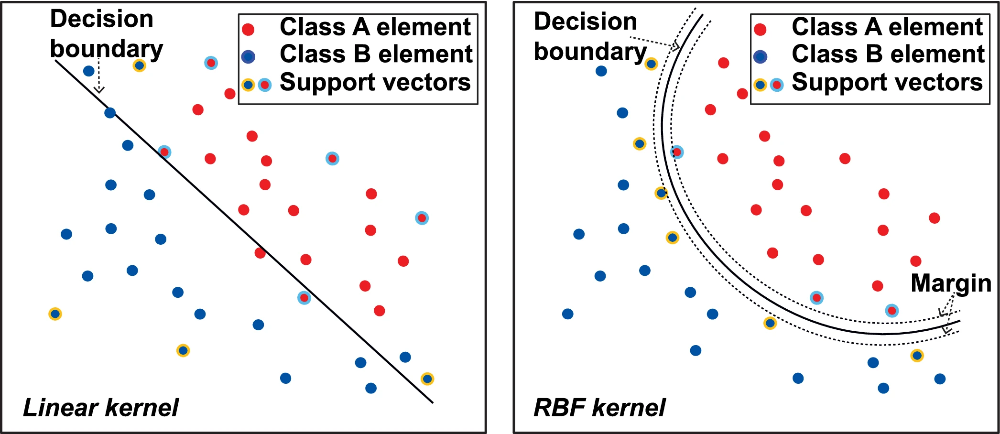


## 3. Example: SVM with Different Kernels on Toy Data
We'll create a synthetic dataset that is **not** linearly separable, then compare linear vs. polynomial vs. RBF SVMs. We’ll see how performance changes.

SVM with different kernels on synthetic data:
Kernel=linear, Accuracy=0.944
Kernel=poly, Accuracy=0.933
Kernel=rbf, Accuracy=0.978


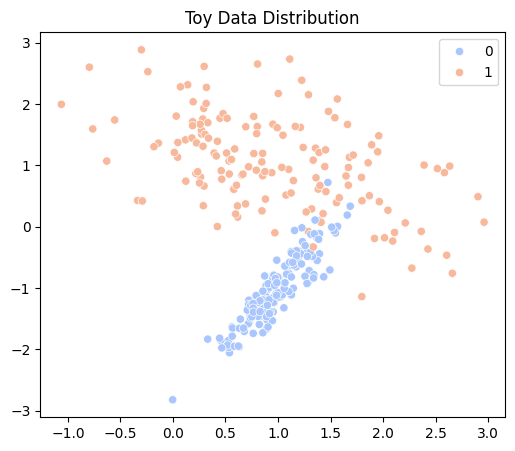

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

def svm_kernel_demo(n_samples=300, random_state=42):
    # create a toy dataset that's somewhat tricky to separate linearly
    X, y = make_classification(
        n_samples=n_samples,
        n_features=2,
        n_informative=2,
        n_redundant=0,
        n_clusters_per_class=1,
        class_sep=1.0,
        random_state=random_state
    )

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=random_state, stratify=y)

    kernels = ["linear", "poly", "rbf"]
    results = {}

    for k in kernels:
        clf = SVC(kernel=k, random_state=random_state)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        results[k] = acc
        print(f"Kernel={k}, Accuracy={acc:.3f}")

    # Quick 2D scatter to see data distribution
    plt.figure(figsize=(6,5))
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, palette="coolwarm")
    plt.title("Toy Data Distribution")
    plt.show()

print("SVM with different kernels on synthetic data:")
svm_kernel_demo()

## 4. Pipelines & ColumnTransformers
Let’s do an example with a dataset that has both **numeric** and **categorical** columns, so we can show how to build a pipeline that **scales** numeric features and **one-hot** encodes categorical features. Then we feed it into an SVM classifier.

We’ll create a toy dataset with `make_classification` plus some artificially labeled categories.

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score,precision_score, recall_score


def advanced_toy_data_pipeline_svm():
    np.random.seed(42)
    # We'll simulate numeric + cat by combining make_classification numeric with a random category
    X_num, y = make_classification(
        n_samples=400, n_features=3, n_informative=2,
        n_redundant=0, random_state=42
    )

    # We'll create a random categorical feature with 3 categories.
    cat_feature = np.random.choice(["A","B","C"], size=(400,1))
    # Combine numeric + cat
    X_full = np.concatenate([X_num, cat_feature], axis=1)

    # We'll name columns: 3 numeric, 1 cat
    columns = ["num1","num2","num3","cat1"]
    df = pd.DataFrame(X_full, columns=columns)
    # numeric columns are floats, cat is strings
    # We'll keep y as is.

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        df, y, test_size=0.3, stratify=y, random_state=42)

    # Identify numeric & cat columns
    num_cols = ["num1","num2","num3"]
    cat_cols = ["cat1"]

    numeric_transformer = Pipeline([
        ("scaler", StandardScaler())
    ])

    categorical_transformer = Pipeline([
        ("ohe", OneHotEncoder(sparse_output=False, handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer([
        ("num", numeric_transformer, num_cols),
        ("cat", categorical_transformer, cat_cols)
    ])

    # SVM classifier in pipeline
    # We'll pick RBF kernel for demonstration.
    svm_pipeline = Pipeline([
        ("preprocess", preprocessor),
        ("svm", SVC(kernel="rbf", gamma="scale", C=1.0, random_state=42))
    ])

    svm_pipeline.fit(X_train, y_train)
    y_pred = svm_pipeline.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average="macro")
    rec = recall_score(y_test, y_pred, average="macro")
    print("SVM Pipeline on advanced toy data ->",
          f"Acc={acc:.3f}, Prec={prec:.3f}, Rec={rec:.3f}")

print("\nAdvanced toy data with numeric+cat columns, pipeline & SVM:")
advanced_toy_data_pipeline_svm()


Advanced toy data with numeric+cat columns, pipeline & SVM:
SVM Pipeline on advanced toy data -> Acc=0.917, Prec=0.917, Rec=0.916


## 5. Advantages & Disadvantages of SVM
### Advantages
- **Effective** in high-dimensional spaces.
- Works well when **clear margin** of separation exists.
- Different **kernel functions** for various data distributions.
- **Memory efficient**: only support vectors matter.

### Disadvantages
- **Parameter selection** (kernel, `C`, `gamma`) can be complex.
- Scaling to **large data** can be slow (SVM training complexity can be O(n^2) to O(n^3)).
- If classes are **overlapping** heavily, linear SVM might struggle.
- Non-linear kernel can handle such overlap but might be more expensive.


## 6. Summary
- We discussed how **SVMs** find a margin to separate classes.
- **Kernels** (linear, poly, RBF) can transform data into higher dimensions to achieve separation.
- We used **advanced toy data** (synthetic) to demonstrate how to build **Pipelines** + **ColumnTransformers** for numeric & categorical features, then feed into an SVM classifier.
- We also covered **advantages** (effective in high-dim, flexible kernels) and **disadvantages** (slower on large data, tricky hyperparameter tuning).

### Next Steps
- Explore **grid search** or **random search** for SVM hyperparameters (`C`, `gamma`, `degree`).
- Try more advanced kernels or custom kernels.
- For **very large** data, consider approximate or linear SVM variants.


In [ ]:
import numpy as np
a = np.array([1, 2, 3])
b = np.array([[10],[20],[30]])
a+b

array([[11, 12, 13],
       [21, 22, 23],
       [31, 32, 33]])